**Train/Dev/Test sets**

- Small datasets 70% (train) 30% (test) or 60% (train) 20% (dev- cross validation) 20% (test)
- Big data 98% (train) 1% (dev) 1% (test)
- rule of thumb: make sure dev and test come from the same distribution
- It may be okay not to have a test set. The goal of the test set is to give you an unbiased estimate of the performance of your final network (an if you don't need an unbiased estimator)

- An estimator is unbiased if, on average, it produces estimates that are equal to the true population parameter. In other words, if we were to take many random samples from the population and compute the estimator for each sample, the average of those estimates would be equal to the true population parameter. Having an unbiased estimator is desirable because it means that the estimator is not systematically overestimating or underestimating the population parameter. Unbiased estimators provide the most accurate representation of the population parameter, which is crucial in making informed decisions and drawing reliable conclusions based on the data. On the other hand, biased estimators systematically introduce errors, which can lead to incorrect inferences and predictions. Biased estimators might consistently overestimate or underestimate the true population parameter, resulting in unreliable and misleading results.


**Bias/Variance**

| data | high variance | high bias | high bias & high variance | low bias & low variance |
|:--------------:|:--------------:|:--------------:|:--------------:|:--------------:|
| train set error   | 1% | 15% | 15% | 0.5% |
| dev set error   | 11%   | 16% | 30% | 1% |

- this is based on the assumption that human level performance gets nearly 0% error or the bayes  optimal(bayesian optimal) error is nearly 0% (if it was different then the bias/variance trade off  will be different) AND that the train and dev set are from the same distribution
- A high-bias model (simple model) tends to underfit the data, meaning it oversimplifies the relationships and fails to capture the complexity of the underlying patterns. This leads to poor performance on both the training data and new, unseen data.
- A high-variance model (complex model) tends to overfit the data, meaning it captures noise and random variations specific to the training data, but it may not generalize well to new data. As a result, it performs very well on the training data but poorly on unseen data.
    - Looking at how much higher your error goes from training set to dev set
- High bias and high variance example
    - high bias because by being mostly a linear classifier (blue solid line) is not fitting the quadratic shape well (blue dashed line)
    - high variance bbecause having too much flexibility in the middle (purple solid line)
    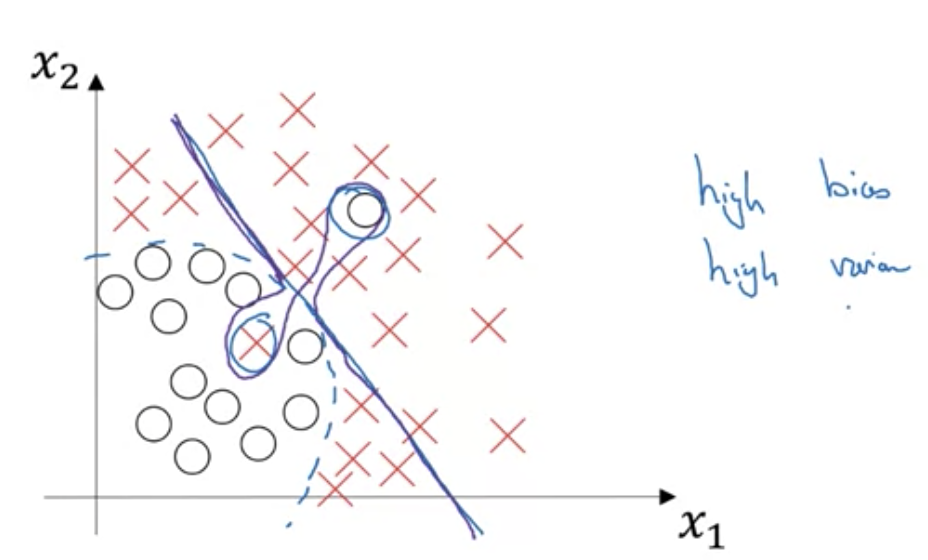


**Basic Recipe for ML Bias/Variance**

- getting a bigger network almost reduces your bias (without necessarily hurting your variance)
- getting more data reduces your variance and doesn't hur your bias much
- it almost never hurts to train a bigger network as long as you regularize it
- there is a little bit of bias variance tradeoff when you use regularization (it may increase the bias although often not too much if you have a big enough network) 
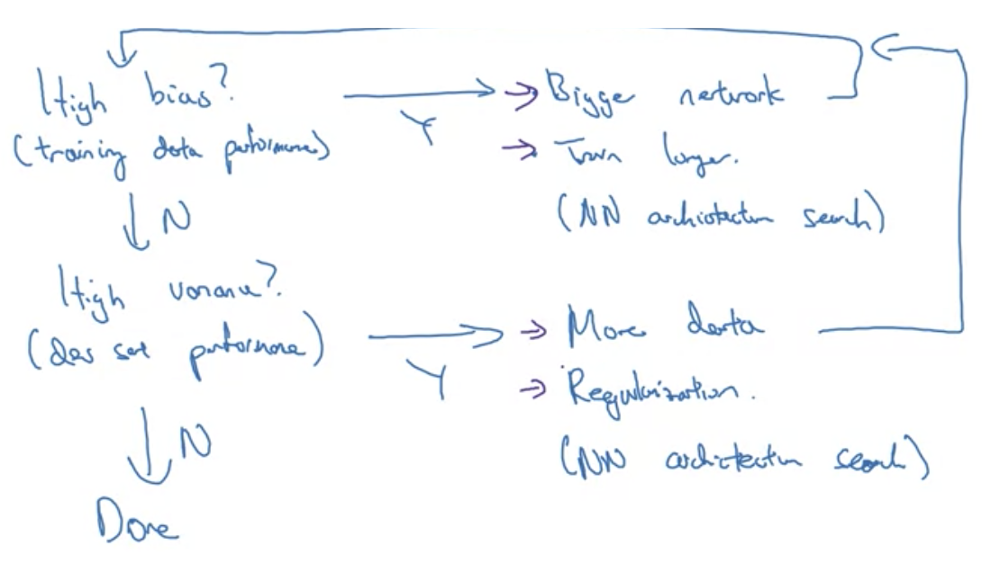

**Regularization**

- L1 regularization, to make your model sparse, helps only a little bit
- L2 regularization is used much more often (also called weight decay)
    - In neural network it is the Frobenious norm (sum of square of elements of a atrix) because we use matrices 
- You pick lambda using your develeopment set or using hold-out cross validation.
- it prevents overfitting
- note:
    - The limit of summation of i should be from 1 to $n^{[l]}$
    - The limit of summation of j should be from 1 to $n^{[l-1]}$
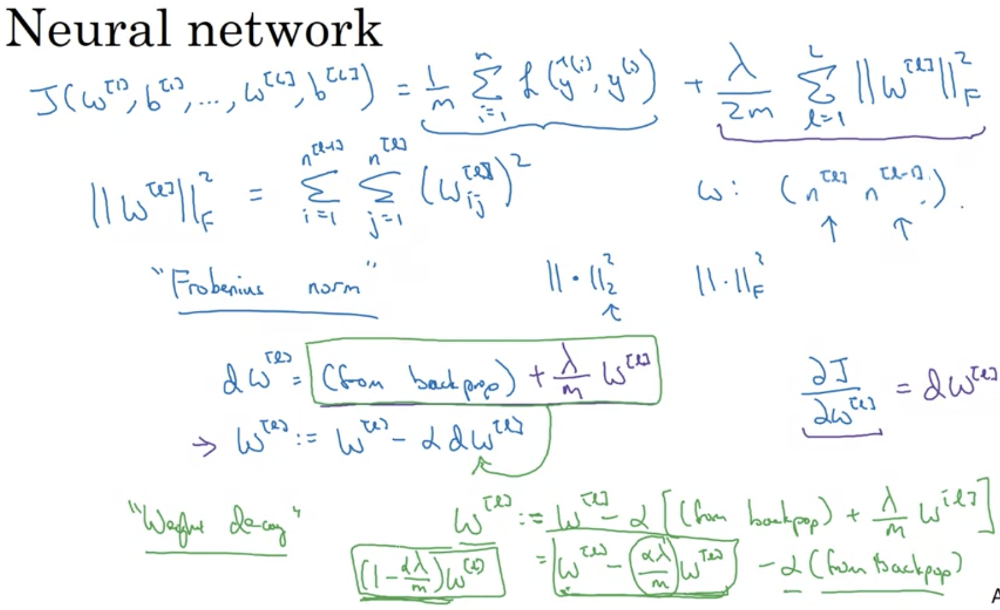
- if we set lambda to be really big then you incentivize to set the weight of the matrices (W) close to zero so a lot of the hidden units zeroes out a lot of the impact of these units
- regularization prevents overfitting for example
    - $g(z) = tanh(z)$
    - if lambda is large then W is small therefore z is small ($z^{[l]} = w^{[l]}*a^{[l-1]} +b$) which causes z to fall within the linear portion of tanh 
    - so it is like every layer will be roughly linear as it is linear regression. So it is not able to fit a complicated (non linear) decision boundaries.

- **Drop regularization**: In dropout regularization, during the training phase, randomly selected neurons (along with their connections) in the neural network are temporarily "dropped out" or deactivated with a probability p. This means that these neurons are ignored during that particular forward and backward pass, effectively reducing the network's capacity and preventing it from becoming too reliant on any specific subset of neurons.
- One downside of dropout is that J function is not longer well defined.
- In most cases, it is recommended to not use dropout if there is no overfit. Although, in computer vision, due to the nature of the data, it is the default practice.
- Decreasing the paraeter keep_prob (e.g. 0.6 to 0.4) will increase the regularization effect.
- The idea behind drop-out is that at each iteration, you train a different model that uses only a subset of your neurons. With dropout, your neurons thus become less sensitive to the activation of one other specific neuron, because that other neuron might be shut down at any time.
- Here's how dropout regularization works:
    - During each training iteration, a random subset of neurons is dropped out with a probability p. The probability p is typically set to a value between 0.2 and 0.5.
    - The forward pass is performed on the modified network with the dropped-out neurons. This means that different neurons are dropped out in each training iteration, leading to a diverse set of sub-networks.
    - The backward pass (backpropagation) is also performed on the modified network, but only the active neurons contribute to the weight updates.
    - By using dropout regularization, the neural network learns to be more robust and prevents overfitting. During the testing or inference phase, dropout is not applied, and the full network is used to make predictions.
    - you don't do dropout for the test set
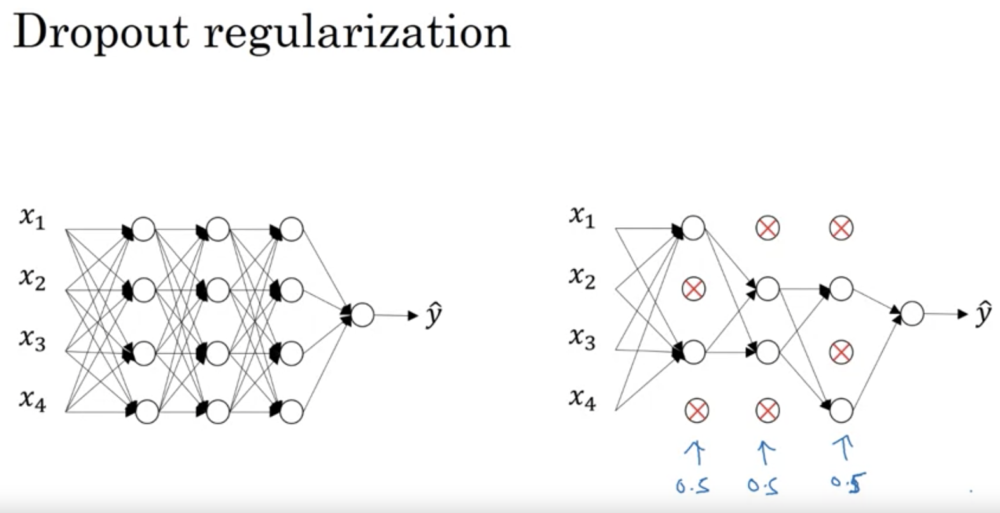

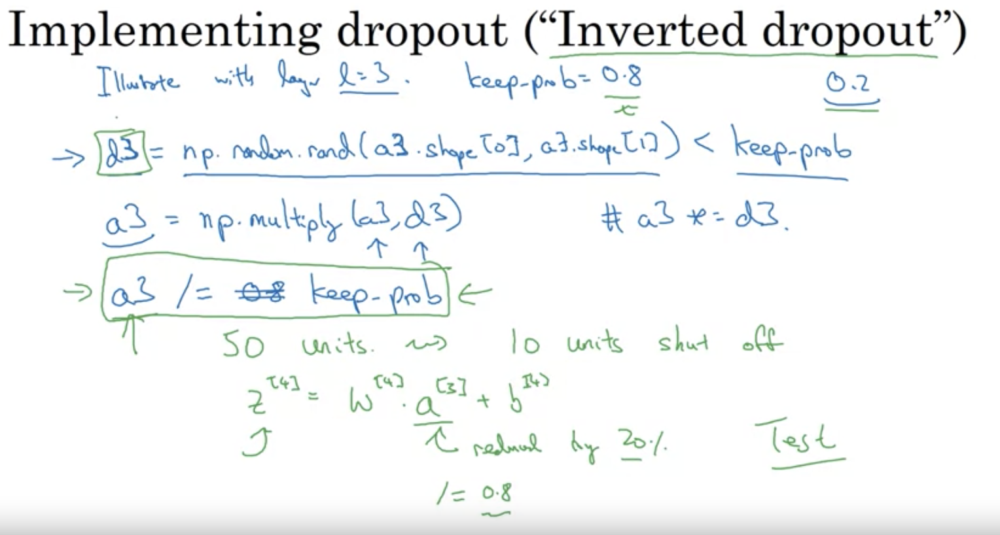
- why does drop-out work?
    - intuition: can'r rely on any feature, so have to spread out weights (this shrink the square norm of the weights - similar to what we saw with L2 regularization)
    - you can set a different percentage dropout to the layer with the highest parameters
    - in practice, we don't dropout the input layer that often

**Other Regularization Methods**

- **Data Augmentation**
    1. for images (the image needs to still be able to show/distiguish the output): 
        a. flip images horizontally
        b. taking random distortions and transformations (zooming/rotation/etc)
    2. adding extra fake training examples don't add as muhc information as a new indepednent image but it is an inexpensive way to give your algorithm more data and therefore sort of regularize it and reduce overfitting 

- **Early stopping** 
- In the context of training a neural network, early stopping works as follows:
    1. During the training process, the model's performance is monitored on a validation set at regular intervals (e.g., after each epoch).
    2. The training process continues until the performance on the validation set starts to degrade or stagnate. This is typically measured using a metric such as validation loss or accuracy.
    3. Once the performance on the validation set does not improve for a certain number of consecutive iterations (epochs), training is stopped early. 
- The rationale behind early stopping is that, during the early stages of training, the model learns patterns and generalizations that are useful for both the training and validation data. However, as training progresses, the model may start to memorize noise or specific patterns unique to the training data, leading to overfitting.
- By stopping the training early, before overfitting occurs, the model is less likely to become overly specialized to the training data and is expected to generalize better to new, unseen data.
- **Downsides**: it couples together the optimization of cost function and  regularization
    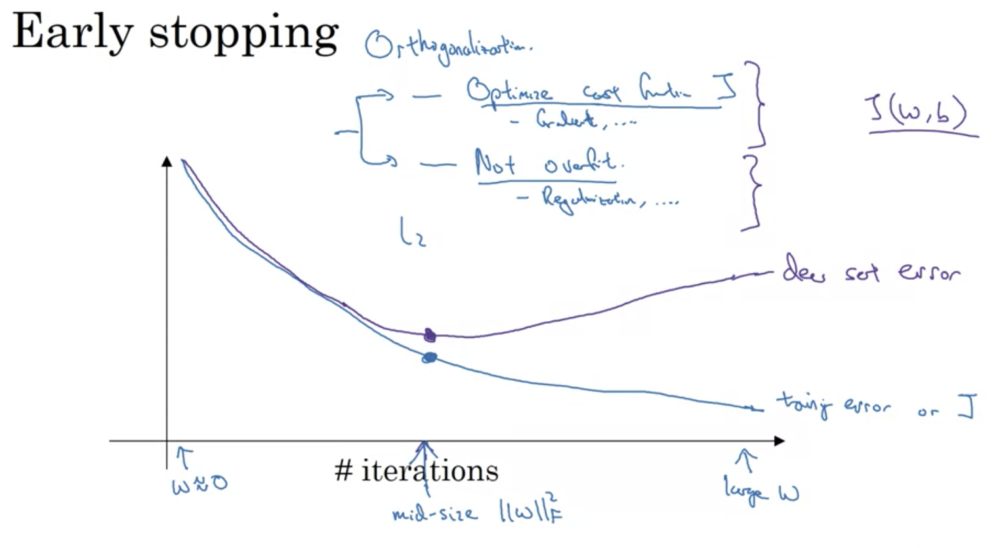
- Orthogonalization refers to a process of decomposing a complex problem or system into separate and independent components. The goal of orthogonalization is to simplify the problem and make it easier to handle by breaking it down into distinct, non-interdependent parts.

**Normalization**

- Normalizing your data helps speed up the model 
    1. improve condition number: less sensitive to changes in input values 
    2. Avoiding Gradient Vanishing/Exploding: it helps in back propagation to keep the features inputs within reasonable range. Ideally we want $w^{[l]}>I$ the identity matrix so it doesn't let the values explode
    3. Faster Learning Rate Convergence
    4. Avoiding Local Minima
    5. Uniform Learning Across Features
- you need to normalize also the test set. For instance, if you use the mean $\mu$ and variance $\sigma^2$ then use these values on test set too
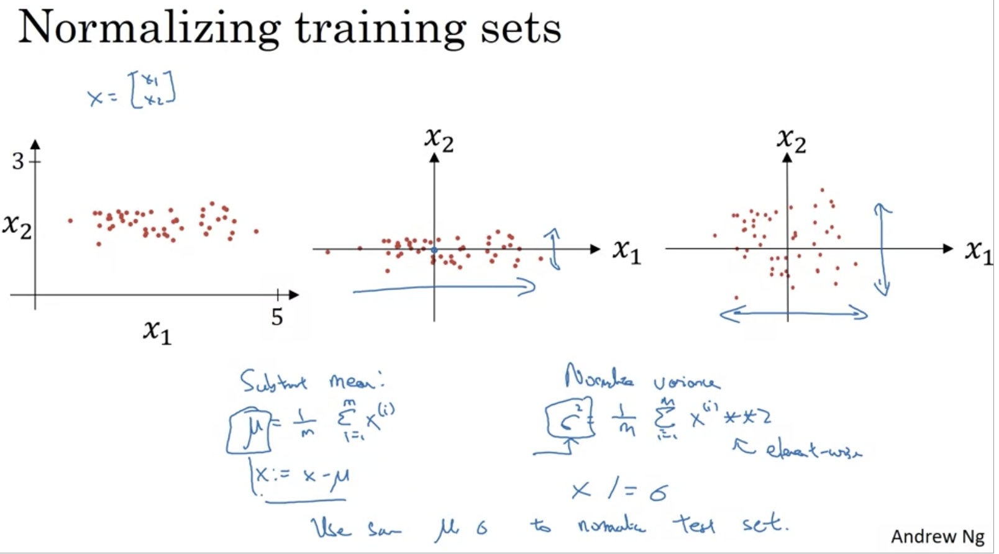

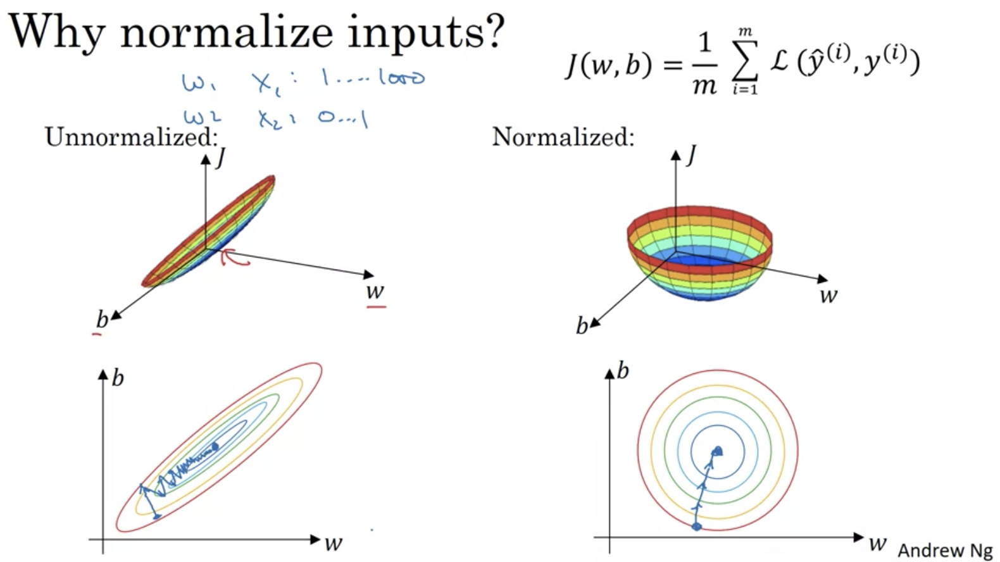

**Weight ($W$) Initialization for Deep Networks**

- Initialize the weights using different methods
- He initialization works well for networks with ReLU activations
- It works better to initialize it with small values (ex np.random.randn(layers_dims[l], layers_dims[l-1]) * 0.01)

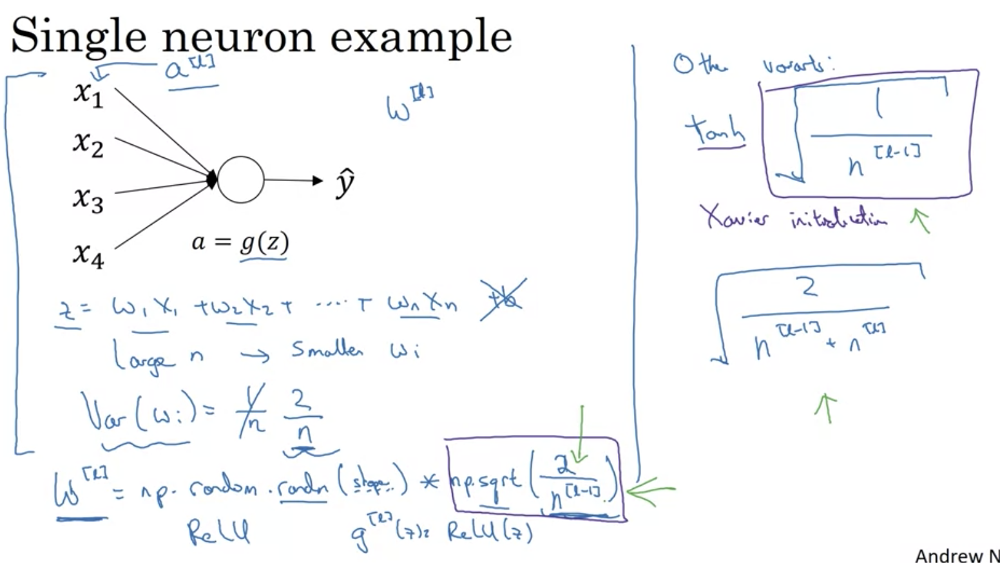

**Gradient Checking Implementation Notes**

- This material is in the second course (improving deep neural network: hyperparammeter tune - week 1)
- Don't use in training - only to debug 
- If algorithm fails grad check, look at components to try to identify bug
- Remember regularization
- Doesn't work with dropout  (unless you set keep-prob=1.0 so you can cehck and then turn on dropout)
- Run at random initialization; perhaps again after some training.


**Optimization Algorithms**


| Batch gradient descent | Mini-batch gradient descent |
|:--------------:|:--------------:|
| uses all train data| breaks the training set into smaller subsets| 
| cost function decreases| cost function decreases but it is more noisy|
|takes longer to train| make progress with all training set|

- Mini-batch gradient descent:
    - Mini-batch gradient descent makes a parameter update after seeing just a subset of examples, the direction of the update has some variance, and so the path taken by mini-batch gradient descent will "oscillate" toward convergence. Using momentum can reduce these oscillations.
    - if  size = m -> batch grading descent
    - if mini-batch size = 1 -> stochastic gradient descent, every example is its own mini batch (and it will not converge, it will kind of oscillate/wander around the region of the minimum, it also loses it speed from vectorization)
        - **Note** also that implementing SGD requires 3 for-loops in total:
            1. Over the number of iterations
            2. Over the $m$ training examples
            3. Over the layers (to update all parameters, from $(W^{[1]},b^{[1]})$ to $(W^{[L]},b^{[L]})$)
    - In practice you use something in between 1 and m. It gives the fastest learning. Also you can make progress without processing all training set
    - you can improve the oscillation by using a smaller learning rate
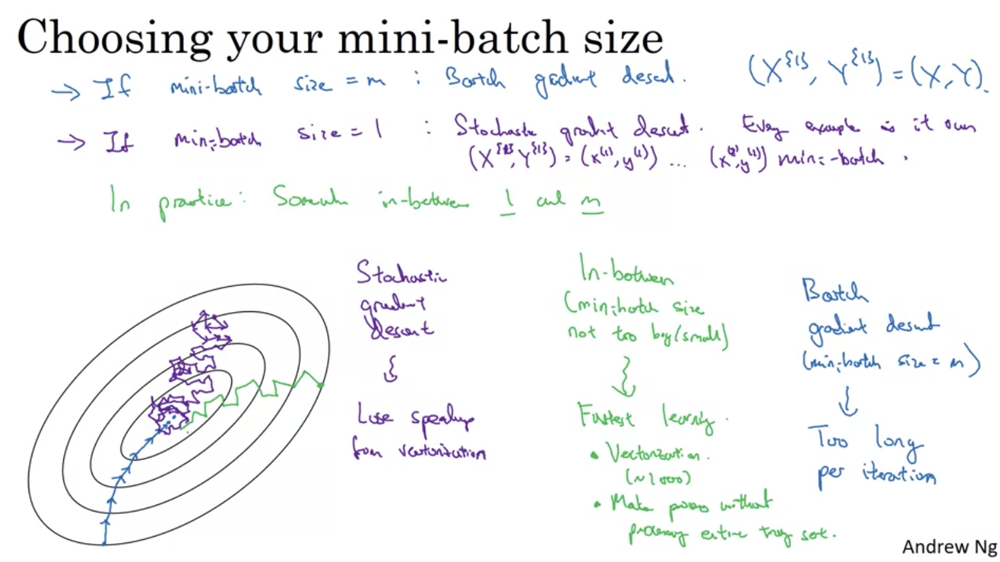

    - Tips for picking the size
        - if the training size is small (m<=2,000) then use batch gradient descent
        - typical mini-batch sizes are 64, 128, 256, 512 (a power of two)
        - Make sure mini-batch fits in CPU/GPU memory (it can also be a hyper-parameter)

- Momentum - Exponential weighted averaged (moving average): $v_t=\beta*v_{t-1} + (1-\beta)\theta_t$ 
    - If $\beta = 0$, then this just becomes standard gradient descent without momentum. 
    - How do you choose $\beta$
        - The larger the momentum $\beta$ is, the smoother the update, because it takes the past gradients into account more. But if $\beta$ is too big, it could also smooth out the updates too much. 
        - Common values for $\beta$ range from 0.8 to 0.999. If you don't feel inclined to tune this, $\beta = 0.9$ is often a reasonable default. 
        - Tuning the optimal $\beta$ for your model might require trying several values to see what works best in terms of reducing the value of the cost function $J$. 
    - Remeber
        - Momentum takes past gradients into account to smooth out the steps of gradient descent. It can be applied with batch gradient descent, mini-batch gradient descent or stochastic gradient descent.
        - You have to tune a momentum hyperparameter $\beta$ and a learning rate $\alpha$.
    - Rule of thumbb on how to think of it
    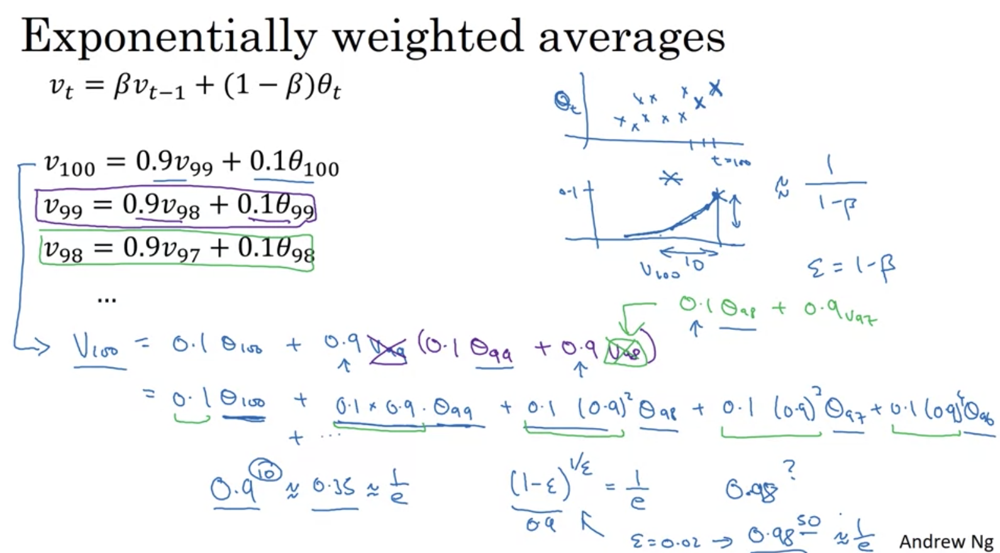
    - Bias correction: in the long run there should not be bias, however, if you want to take the bias of early estimates then you can do the following

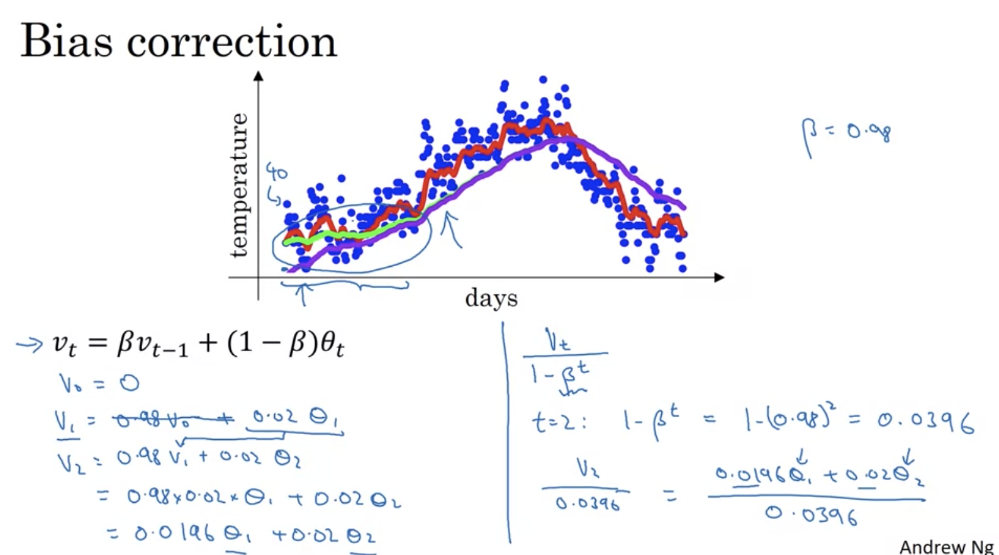

- Gradient descent with momentum: almost always works faster than gthe standard gradient descent algorothm. The idea is to compute an exponentially weighted average of your gradients and then use that gradient to update your weights instead.
    - no need to calculate $(1-\beta)$ the only thing to keep on mind is that the learning rate needs to be tuned differently
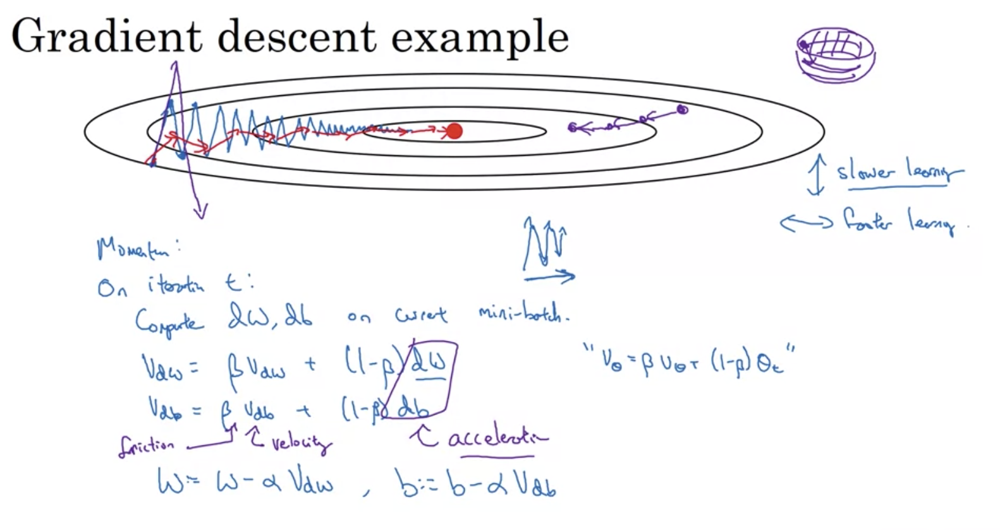

- RMS (root-mean-square) prop 
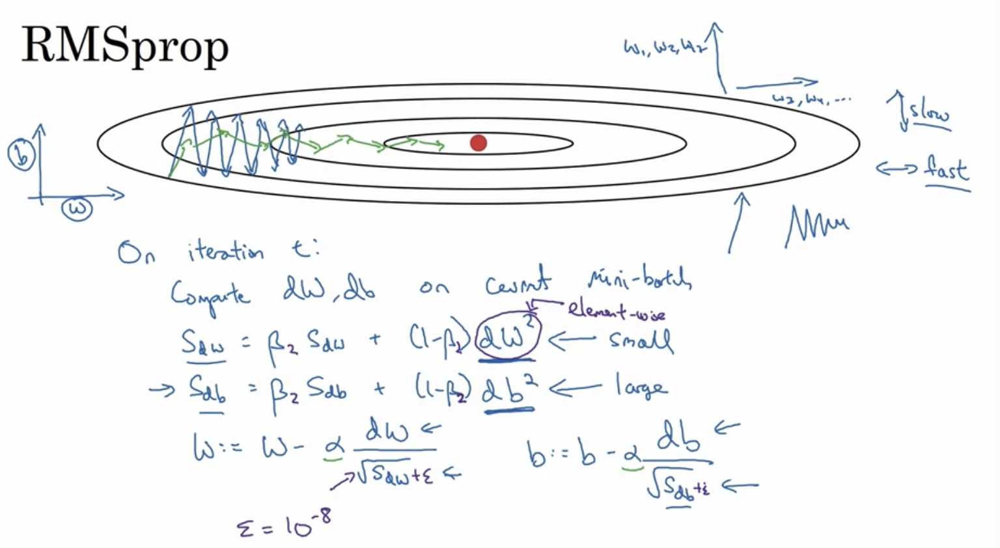



- Adam (Adaption Moment Estimation)  Optimization
    - Adam is one of the most effective optimization algorithms for training neural networks. It combines ideas from RMSProp (described in lecture) and Momentum. 

        - How does Adam work?
            1. It calculates an exponentially weighted average of past gradients, and stores it in variables $v$ (before bias correction) and $v^{corrected}$ (with bias correction). 
            2. It calculates an exponentially weighted average of the squares of the past gradients, and  stores it in variables $s$ (before bias correction) and $s^{corrected}$ (with bias correction). 
            3. It updates parameters in a direction based on combining information from "1" and "2".
        - The update rule is, for $l = 1, ..., L$: 
        $$\begin{cases}
        v_{dW^{[l]}} = \beta_1 v_{dW^{[l]}} + (1 - \beta_1) \frac{\partial \mathcal{J} }{ \partial W^{[l]} } \\
        v^{corrected}_{dW^{[l]}} = \frac{v_{dW^{[l]}}}{1 - (\beta_1)^t} \\
        s_{dW^{[l]}} = \beta_2 s_{dW^{[l]}} + (1 - \beta_2) (\frac{\partial \mathcal{J} }{\partial W^{[l]} })^2 \\
        s^{corrected}_{dW^{[l]}} = \frac{s_{dW^{[l]}}}{1 - (\beta_2)^t} \\
        W^{[l]} = W^{[l]} - \alpha \frac{v^{corrected}_{dW^{[l]}}}{\sqrt{s^{corrected}_{dW^{[l]}}} + \varepsilon}
        \end{cases}$$
        where:
        - t counts the number of steps taken of Adam 
        - L is the number of layers
        - $\beta_1$ and $\beta_2$ are hyperparameters that control the two exponentially weighted averages. 
        - $\alpha$ is the learning rate
        - $\varepsilon$ is a very small number to avoid dividing by zero

        As usual, all parameters are stored in the `parameters` dictionary 

    - it is taking momentum and RMSprop together
    - you implement bias correction $V^{correccted}_{dw} = \frac{V_{dw}}{1-\beta^{t}_1}$ and the others
    - Hyperparameters choice: 
        - $\alpha$: needs to bbe tuned
        - $\beta_1$: 0.9 ($dw$)
        - $\beta_2$:0.999 ($dw^2$)
        - $\epsilon$:$10^{-8}$
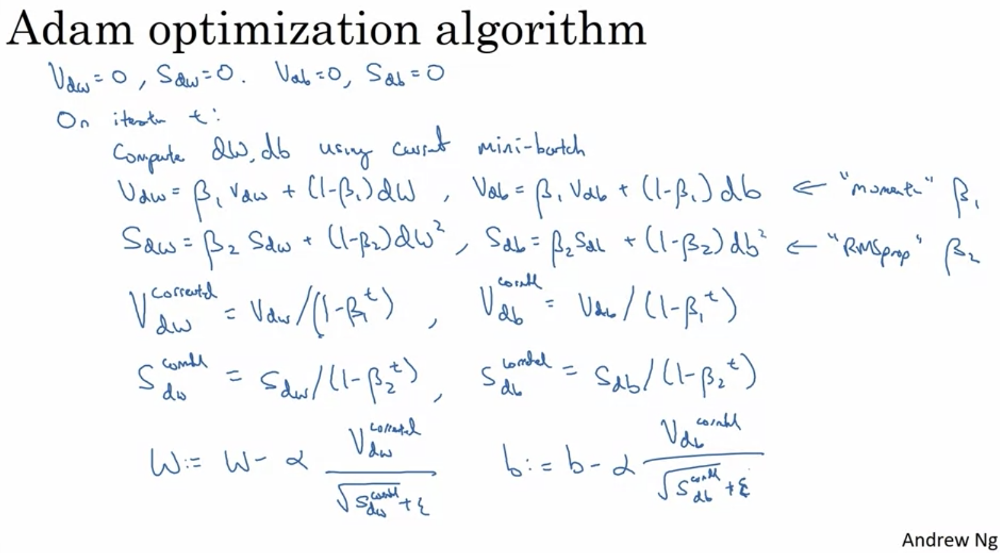  

- Learning Rate Decay: slowly reduce the learning over time may help speed up the learning algorithm
    - $\alpha = \frac{1}{1+decarRate*epochNumber}\alpha_0$
    - epoch = 1 pass though data
    - other learning rate decay methods:
        - exponential decay $\alpha=0.95^{epoch-num}\alpha_0$ 
        - $\alpha = \frac{k}{\sqrt{epoch-num}}\alpha_0$ or $\frac{k}{\sqrt{t}}\alpha_0$
        - discrete stair case
        - manual decay
        
- The problem of local optima
    - you're actually pretty unlikely to get stuck in bad local optima so long as you're training a reasonably large neural network, save a lot of parameters, and the cost function J is defined over a relatively high dimensional space
    - plateau is a region where the derivative is clode to zero for a long time and can really slow down learning rate
    - Adam optimization can help speed it up the learning rate
    
**Tuning Process**

- Some hyperparameters to tune 
    - $\alpha$ most important (learning rate)
    - $\beta$ (momentum - 0.9 default is a good value) second in importance 
    - $\beta_1, \beta_2, \epsilon$ for Adam typically left default (0.9, 0.999 $10^8$)
    - \# of layers third in importance
    - \# of hidding units second in importance
    - learning decay third in importance
    - mini-batch size second in importance
- try random values than a grid
- coarse to fine search: it involves conducting a broad or coarse search over a large search space initially, followed by progressively narrowing down the search space to achieve higher precision and accuracy.
- Formula to search on a lagorithm scale (e.g learning rate) as it helps in obtaining a more balanced and representative dataset. It is a bad idea to sample in a linear scale small values.
    - Steps for $\alpha$
        1. pick lowest value a ($a=log_{10}(0.0001)=-4$)
        2. pick the highest value ($b=log_{10}(1)=0$)
        3. pick uniformly at random from $r\in[-4,0]$ (r=$-4$*np.random.rand()
        4. $\alpha=10^r$
    - Steps for $\beta$
        1. $1-\beta$ = 0.1 ... 0.001
        2. $r\in[-3, -1]$ (e.g. $log_{10}(0.1)=-3$)
        3. $1-\beta = 10^r$
        4. $\beta = 1-10^r$

**Batch Normalization (BN)**

- Makes the hyperparameter search problem much easier
- Makes the neural network much more robust 
- May help to train deep networks
- It normalizes $a^{[l]}$ so it can train $w^{[l]}, b^{[l]}$ faster
- Typically you normalize $Z^{[l]}$
- Steps: given some intermediate values in NN $z^{(1)}, z^{(2)} ... z^{(m)}$ to have mean zero and variance 1
    1. get $\mu=\frac{1}{m}\sum_{i=1}^{m} z^{(i)}$
    2. get $\sigma^2=\frac{1}{m}\sum_{i=1}^{m} (z_i -\mu)^2$
    3. $z^{(i)}_{norm} = \frac{z^{(i)}-\mu}{\sqrt{(\sigma^2+\epsilon)}}$ - \epsilon is just in case \sigma^2 is zero
- We don't always want the hidden units to have mean zero and variance one, it makes sense for hidden units to have a different distribution, so we compute $\tilde{z}^{(i)} = \gamma z^{(i)}_{norm} +\beta$, $\gamma$ and $\beta$ are learnable parameters of the model.
    - if $\gamma = \sqrt{\sigma^2 + \epsilon}$ and $\beta=\mu$ then $\tilde{z}^{(i)} = z^{(i)}$ as this makes something similar to the identity matrix so you can use $\tilde{z}^{[l](i)}$ instead of $z^{[l](i)}$
    - we want our hidden parameters to not have mean 0 and variance once in order to take advatnage of the nonlinearity sigmoid function. It also shows that the hidden units have standarized mean and variance (where the mean and variance are controlled by $\gamma$ and $\beta$
    - The $\beta$ here is different that from momentum
    - BN typically used with mini-batches
    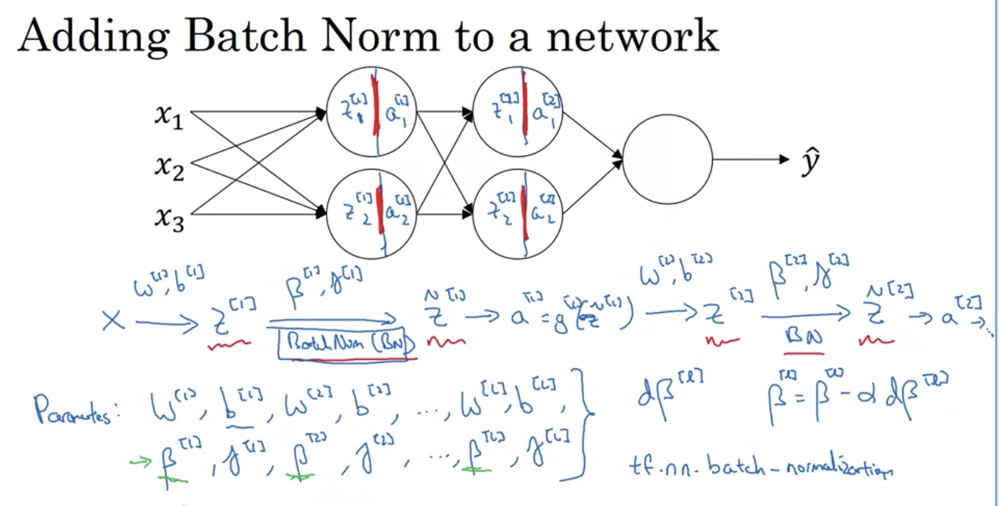    



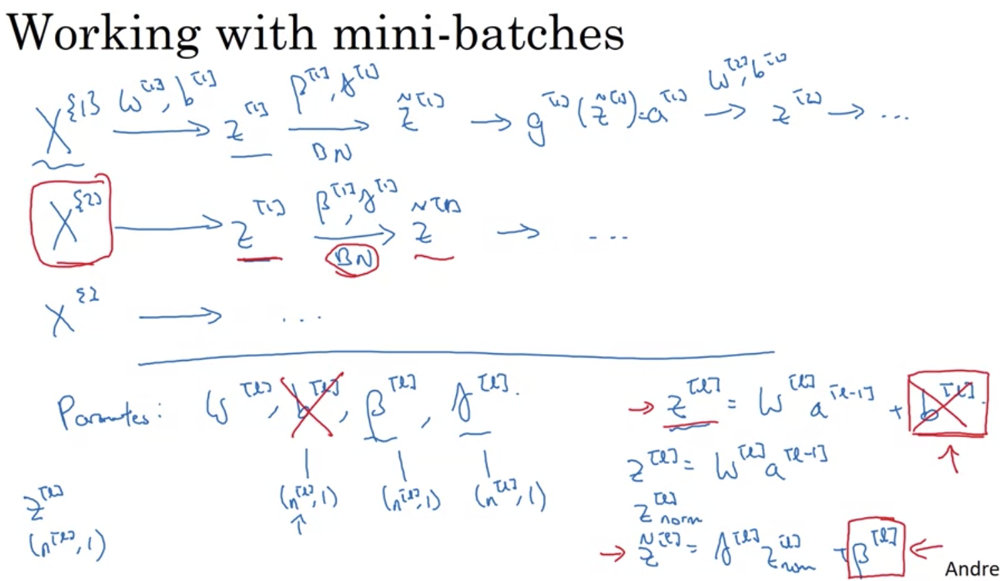

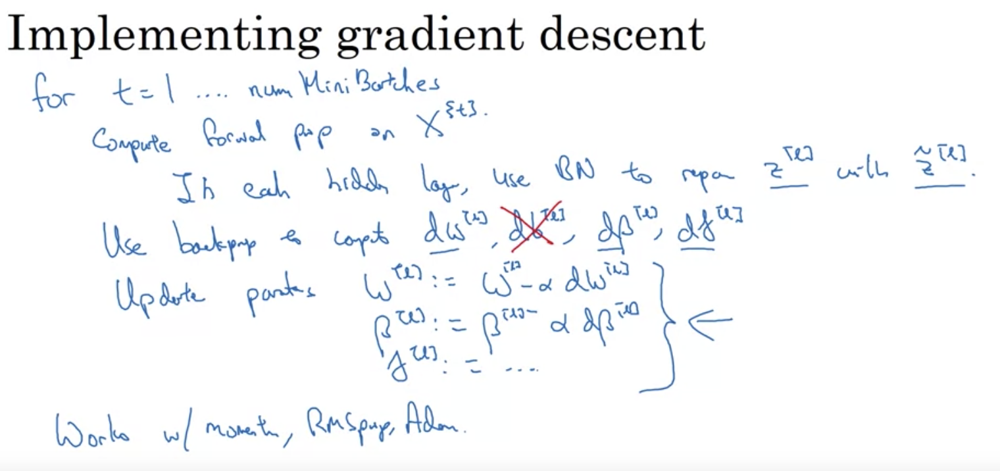
- Why does BN work? 
    - it makes weights, later or deepeter in your nn, more robust to changes to weights in earlier layers
    - Covariate shift when your train model distribution is changes on the test set (shifting input distribution)
    
- **Batch Norm as regularization**
    - Each mini-atch is caled by the mean/variance computed on just that mini-batch
    - This adds some noise tot he values $z^{[l]}$ within that minibatch. So similar to dropout, it adds some noise to each hidden layer's activations
    - This has a slight regularization effect

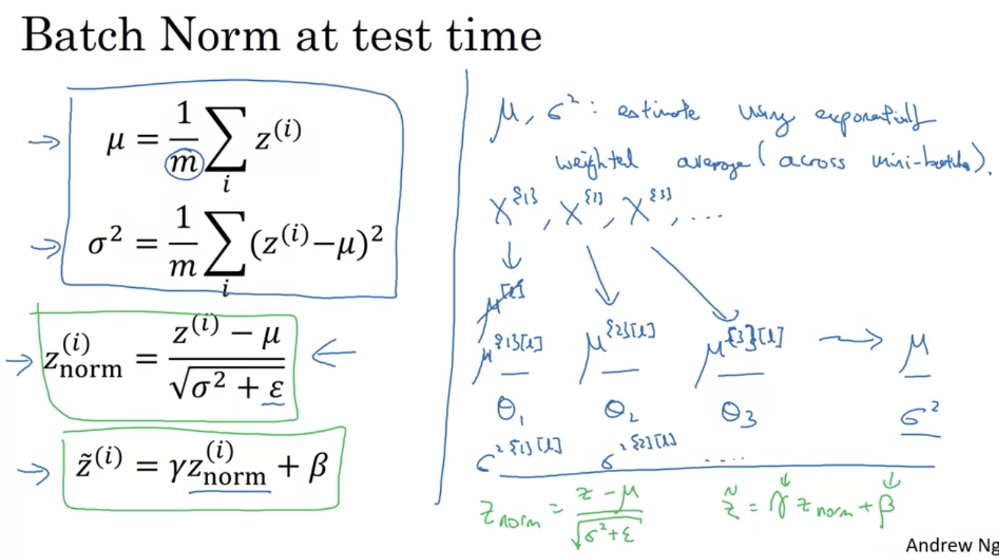

- Batch Norm for test data
    1. estimate $\mu$ and $\sigma^2$ using exponential weighted average (across mini batch)
    2. use those values to do the scaling ($z_{norm}$)

**Multi-classification: Softmax Regression**

- the decision boundaries between classess is linear (when there are NO hidden layers)
- Softmax regression generalizes logistic regression to C classes
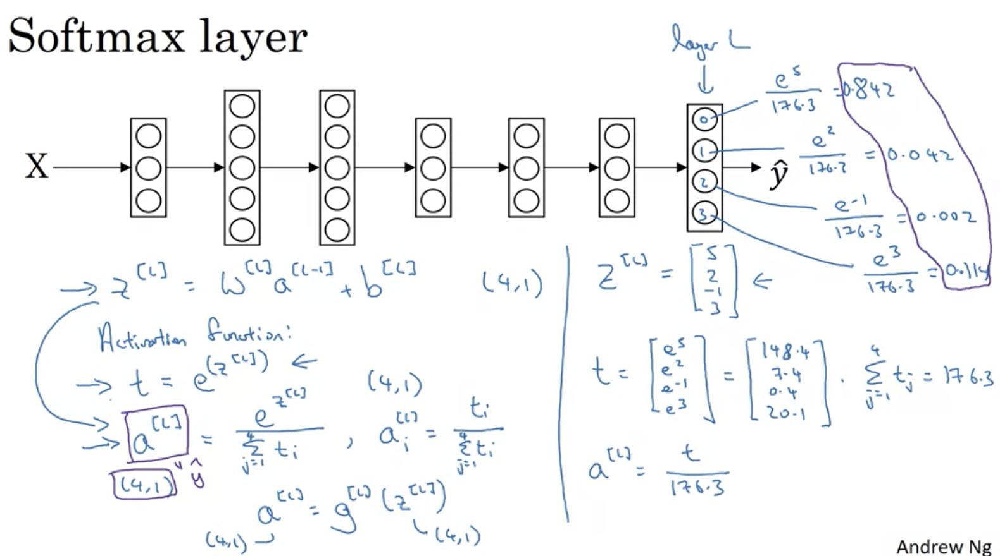